## Packages

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm,trange

import ehtim as eh

Welcome to eht-imaging! v  1.1.1


In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

## Peek at dataset

Loading uvfits:  inputs/obs30000.fits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
[ 1.        +6.77550133e-06j -0.0031807 +6.96140109e-03j
 -0.00317997-6.96085813e-03j ...  1.        +6.42095847e-06j
 -0.00278761+6.69931341e-03j -0.0027869 -6.69866521e-03j]
Loading fits image:  outputs/img30000.fits


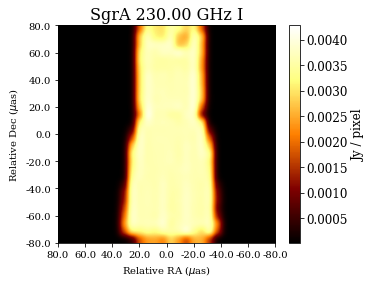

Loading uvfits:  inputs/obs30001.fits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
[1.        +5.23500785e-05j 0.00751609+4.29503561e-04j
 0.00751686-4.31275257e-04j ... 1.        +5.17358749e-05j
 0.00802947+1.93501508e-03j 0.00803019-1.93684723e-03j]
Loading fits image:  outputs/img30001.fits


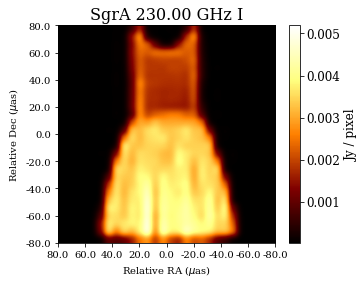

Loading uvfits:  inputs/obs30002.fits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
[ 1.        -2.48834858e-05j -0.02212389+1.72595251e-02j
 -0.02212748-1.72569491e-02j ...  1.        -2.61828791e-05j
 -0.02575505+1.46321971e-02j -0.02575883-1.46292700e-02j]
Loading fits image:  outputs/img30002.fits


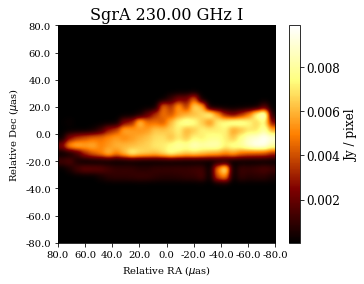

Loading uvfits:  inputs/obs30003.fits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
[ 1.00000000e+00+9.60121724e-07j -1.17689499e-03-1.55000447e-03j
 -1.17520953e-03+1.54964125e-03j ...  1.00000000e+00+5.77089509e-07j
 -1.22267375e-05-1.18825154e-03j -1.06084344e-05+1.18776155e-03j]
Loading fits image:  outputs/img30003.fits


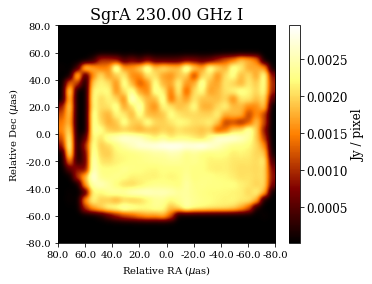

Loading uvfits:  inputs/obs30004.fits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
[1.00000000e+00-9.50150206e-06j 5.26243239e-04+7.70255807e-04j
 5.25920477e-04-7.70664250e-04j ... 1.00000000e+00-9.73860006e-06j
 5.44691982e-04+1.22947397e-03j 5.44497801e-04-1.22994324e-03j]
Loading fits image:  outputs/img30004.fits


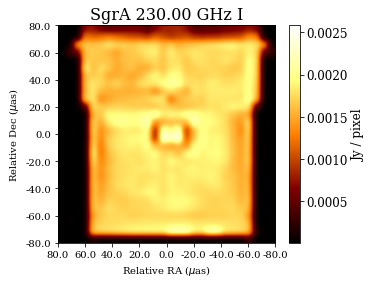

Loading uvfits:  inputs/obs30005.fits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
[ 1.00000000e+00-7.10092399e-06j  5.27105993e-04-1.25679737e-02j
  5.25913958e-04+1.25657571e-02j ...  1.00000000e+00-6.88097680e-06j
 -4.20322729e-04-1.11130942e-02j -4.21376317e-04+1.11108115e-02j]
Loading fits image:  outputs/img30005.fits


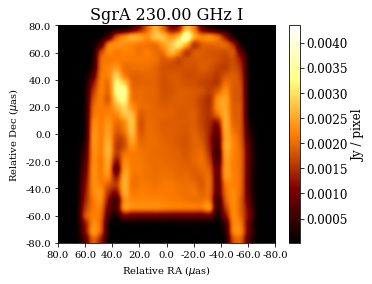

Loading uvfits:  inputs/obs30006.fits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
[ 1.        -5.05793287e-06j -0.00863076-3.43038514e-03j
 -0.00863449+3.42877512e-03j ...  1.        -6.11786527e-06j
 -0.01251304-1.37774192e-03j -0.01251737+1.37586251e-03j]
Loading fits image:  outputs/img30006.fits


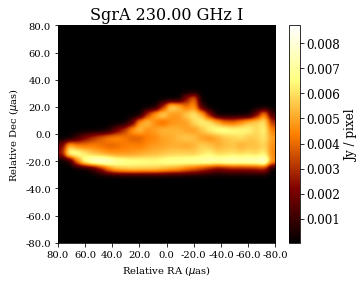

Loading uvfits:  inputs/obs30007.fits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
[1.        +4.89686172e-05j 0.01965439+6.82466524e-03j
 0.01965463-6.82408269e-03j ... 1.        +4.82858886e-05j
 0.01975877+6.67294953e-03j 0.01975881-6.67236699e-03j]
Loading fits image:  outputs/img30007.fits


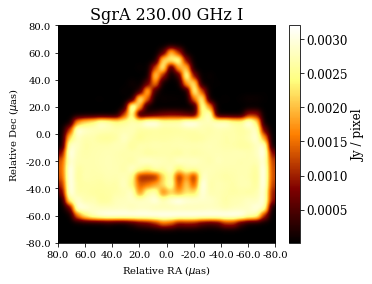

Loading uvfits:  inputs/obs30008.fits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
[1.        -3.19553001e-05j 0.0625027 +7.21658319e-02j
 0.06249443-7.21728504e-02j ... 1.        -3.37458114e-05j
 0.05549327+7.74860382e-02j 0.05548314-7.74911046e-02j]
Loading fits image:  outputs/img30008.fits


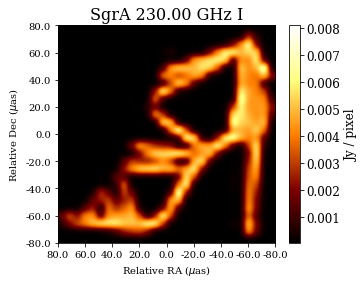

Loading uvfits:  inputs/obs30009.fits
no IF in uvfits header!
POLREP_UVFITS: circ
Number of uvfits Correlation Products: 4
[ 1.        -2.18595414e-06j -0.04807898-1.30202640e-02j
 -0.04808348+1.30270878e-02j ...  1.        -3.00501893e-06j
 -0.0518241 -1.92118250e-02j -0.05182832+1.92186963e-02j]
Loading fits image:  outputs/img30009.fits


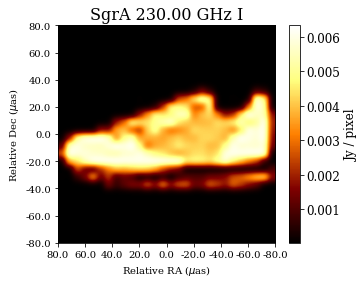

In [3]:
for i in range(30000, 30010):
    obs_uv = eh.obsdata.load_uvfits("inputs/obs{0}.fits".format(i))
    print(obs_uv.data['vis'])
    im = eh.image.load_fits("outputs/img{0}.fits".format(i))
    im.display()

In [5]:
# Look at type and shape of visibility observations
print(obs_uv.data['vis'].shape)
print(type(obs_uv.data['vis'][0]))
print(obs_uv.data['vis'][0].real, obs_uv.data['vis'][0].imag)

(1030,)
<class 'numpy.complex128'>
1.0 -2.185954144806601e-06


In [6]:
# Look at image shape
print(im.imvec.shape)
print(im.imvec.reshape((28, 28)).shape)

(784,)
(28, 28)


In [158]:
obs_uv?

## Helper functions and variables

In [7]:
# num visibility values, split into real/complex
INPUT_SIZE = 1030*2
INPUT_SHAPE = (1030, 2)

# n pixels in image
OUTPUT_SIZE = 28*28
OUTPUT_SHAPE = (28, 28)

In [8]:
# Convert data to torch pickle file for faster loading
def save_data_as_torch(start, end):
    """Reads in visibilities and images from [start, end) and saves them."""
    n = end - start
    x, y = np.empty((n, *INPUT_SHAPE)), np.empty((n, *OUTPUT_SHAPE))
    
    for i in trange(n):
        obs = eh.obsdata.load_uvfits('inputs/obs{}.fits'.format(start + i))
        im = eh.image.load_fits('outputs/img{}.fits'.format(start + i))
        
        # separate real and imaginary components of visibilities
        x[i] = np.asarray((obs.data['vis'].real, obs.data['vis'].imag)).T
        y[i] = im.imvec.reshape(28, 28)
    
    x = torch.as_tensor(x, dtype=torch.float)
    y = torch.as_tensor(y, dtype=torch.float)
    
    torch.save(x, 'inputs/x_{}-{}.pickle'.format(start, end))
    torch.save(y, 'outputs/y_{}-{}.pickle'.format(start, end))

In [ ]:
save_data_as_torch(0, 15000)

In [10]:
to_display = eh.image.load_txt('eht-imaging/models/avery_sgra_eofn.txt');
to_display = to_display.resample_square(28)

def show_image(arr):
    """Displays image given a ndarray of pixels in shape (28,28)."""
    to_display.imvec = arr.reshape(784)
    to_display.display()

Loading text image:  eht-imaging/models/avery_sgra_eofn.txt


## Load dataset

In [49]:
# Load data
x = torch.load("inputs/x_0-15000.pickle")
x = torch.cat((x, torch.load("inputs/x_15000-30000.pickle")))
x = torch.cat((x, torch.load("inputs/x_30000-45000.pickle")))

y = torch.load("outputs/y_0-15000.pickle")
y = torch.cat((y, torch.load("outputs/y_15000-30000.pickle")))
y = torch.cat((y, torch.load("outputs/y_30000-45000.pickle")))

x_train = x[:44000]
y_train = y[:44000]
x_test = x[44000:]
y_test = y[44000:]

trainset = torch.utils.data.TensorDataset(x_train, y_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True)

testset = torch.utils.data.TensorDataset(x_test, y_test)
testloader = torch.utils.data.DataLoader(testset, batch_size=1, shuffle=True)

## Define model

Careful, can't load pretrained 2dense2conv with below code block. Check the txt file under models/ for the current model implementation

In [134]:
class ConvNet(nn.Module):

    def __init__(self):
        super(ConvNet, self).__init__()
        
        # Dense layers
        self.dense1 = nn.Sequential(
#             nn.Dropout(p=.1),
            nn.Linear(INPUT_SIZE, 56*56),
            nn.ReLU(),
        )
        
        self.dense2 = nn.Sequential(
            nn.Linear(56*56, 64*64),
            nn.ReLU(),
        )

        # Convolutional layers
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=10, kernel_size=6),
            nn.BatchNorm2d(num_features=10),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, padding=1),
        )
        
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=10, out_channels=1, kernel_size=3),
            nn.BatchNorm2d(num_features=1),
            nn.ReLU(),
        )
        
        self.loss = nn.MSELoss()

    def forward(self, x):
        """
        x : shape(batch, 1030, 2)
        
        out : shape(batch, 28, 28)
        """
        
        x = x.flatten(start_dim=1)
        x = self.dense1(x)
        x = self.dense2(x)
        
        # Reshape flat data into a square for convolving
        x = x.view(-1,1,64,64)
        x = self.conv1(x)
        x = self.conv2(x)
        x = x.squeeze(dim=1)
        
        return x

In [106]:
# Initialize model and optimizer
model = ConvNet()

optimizer = optim.Adam(model.parameters(), lr=1e-3)

## Train model


Target


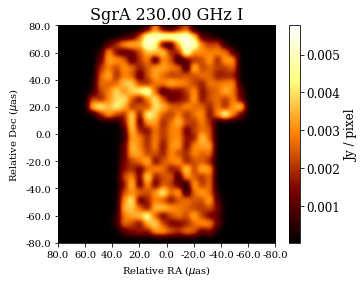

Reconstruction


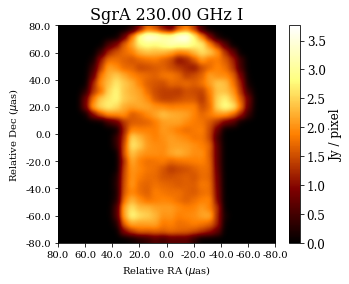

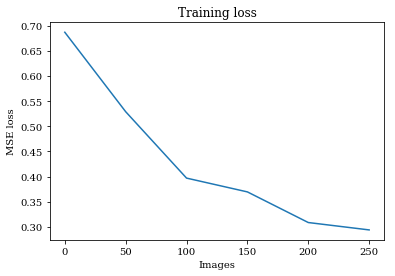


Target


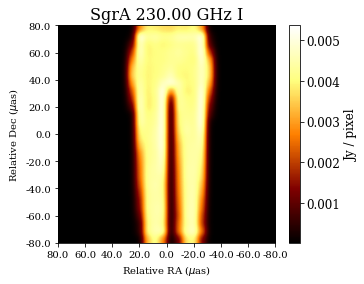

Reconstruction


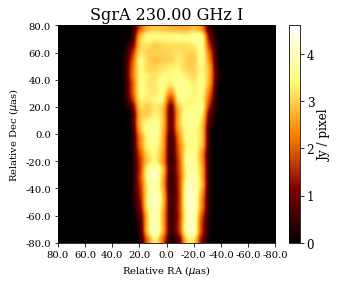

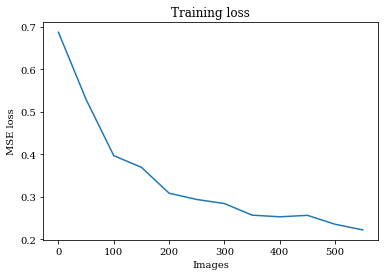


Target


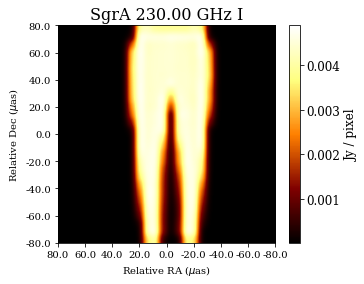

Reconstruction


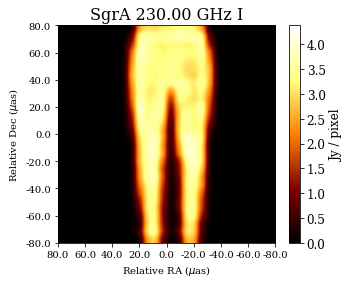

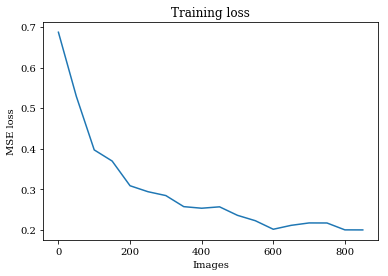


Target


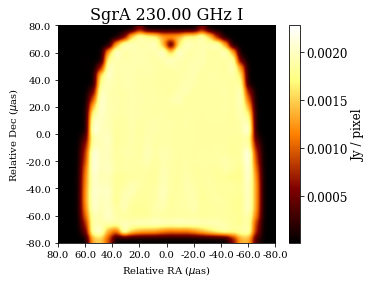

Reconstruction


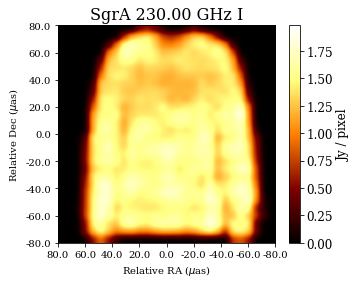

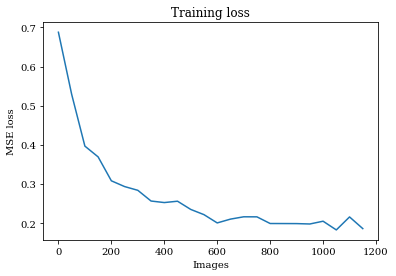


Target


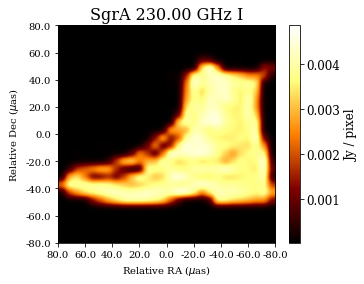

Reconstruction


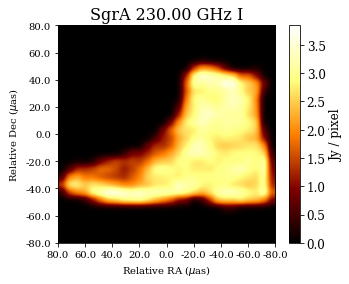

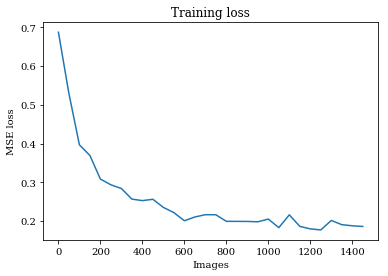


Target


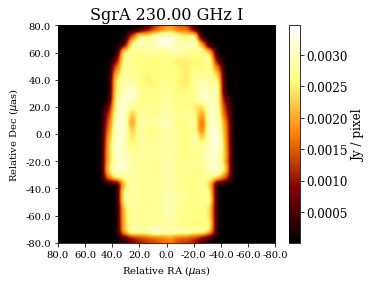

Reconstruction


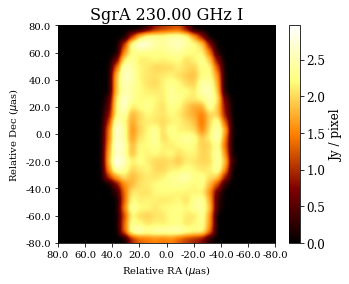

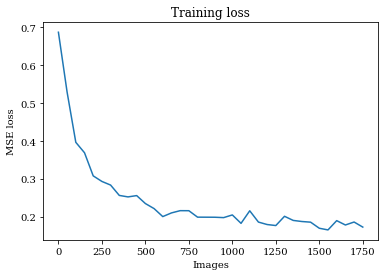


Target


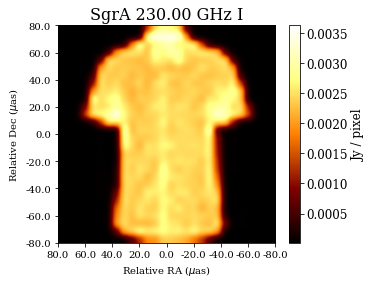

Reconstruction


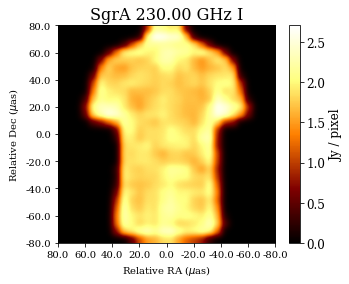

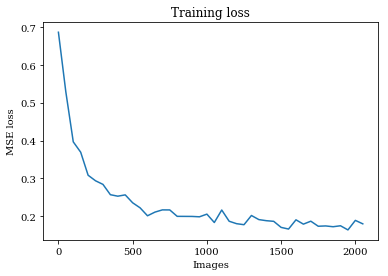


Target


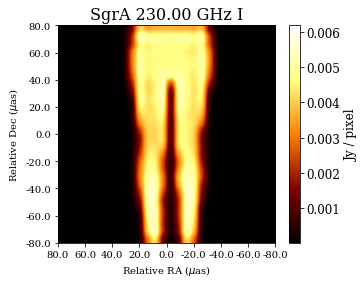

Reconstruction


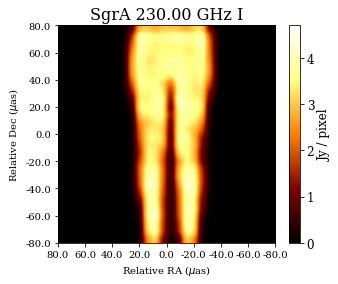

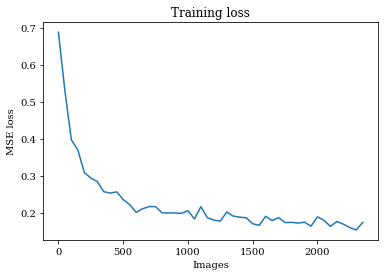


Target


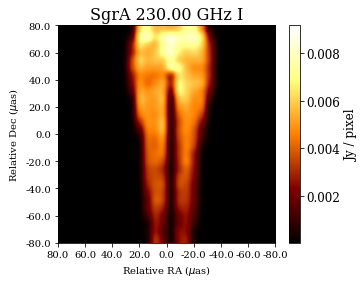

Reconstruction


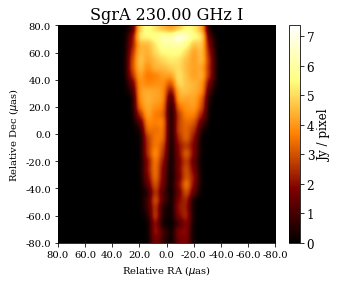

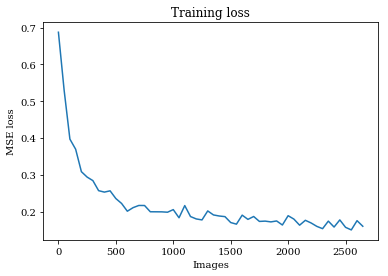


Target


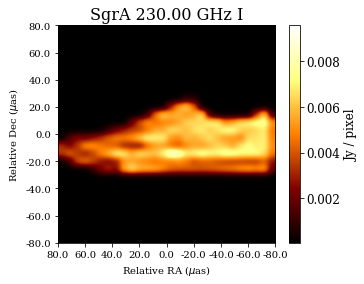

Reconstruction


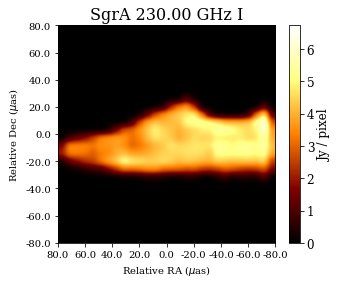

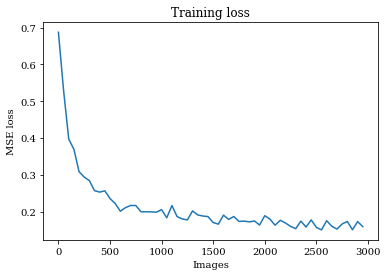

Finished Training


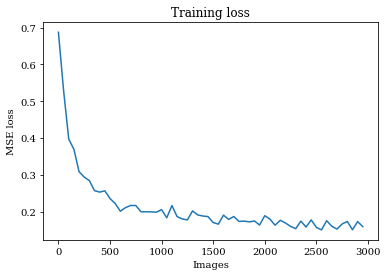

In [107]:
n_epochs = 10

# This turns on autograd so .backward() will update the model
model.train()

# Track training loss to graph later
losses = []

for epoch in range(n_epochs):

    running_loss = 0.0
    cnt = 1    # count number batches trained on
    
    # Use tqdm for pretty loading bar while training
    with tqdm(trainloader, desc='Epoch {}'.format(epoch+1)) as t:
        for data in t:
            # get the inputs and outputs; data is a list of [vis, imgs]
            # vis shape = (batch, 1030, 2)
            # imgs shape = (batch, 28, 28)
            vis, imgs = data

            #############################
            # MAIN TRAINING BLOCK START #
            #############################
        
            optimizer.zero_grad()                          # clear gradients
            outs = model(vis)                              # compute predictions for batch
            loss = model.loss(outs, OUTPUT_SIZE * imgs)    # compute loss for batch
            loss.backward()                                # backpropagate loss
            optimizer.step()                               # perform gradient updates
            
            ###########################
            # MAIN TRAINING BLOCK END #
            ###########################

            # print statistics and progress
            running_loss += loss.item()    # scalar
            
            # update loss in loading bar every 5 mini-batches
            if cnt % 5 == 0:    
                if cnt % 50 == 0:
                    losses.append(running_loss / 5)    # plot on graph
                    
                t.set_postfix(loss=running_loss / 5)
                running_loss = 0.0
            
            cnt += 1
            
    # Show example image for current progress
    print('Target')
    show_image(imgs[-1].detach().numpy())
    print('Reconstruction')
    show_image(outs[-1].detach().numpy())
    
    # Visualize training loss curve
    fig, ax = plt.subplots()
    ax.plot(list(range(0, len(losses)*50, 50)), losses)
    ax.set(xlabel='Batches', ylabel='MSE loss', title='Training loss')
    plt.show()
            

print('Finished Training')

# Visualize training loss curve
fig, ax = plt.subplots()
ax.plot(list(range(0, len(losses)*50, 50)), losses)
ax.set(xlabel='Batches', ylabel='MSE loss', title='Training loss')
plt.show()

## Save model

In [118]:
# save model
torch.save(model.state_dict(), "models/2dense2conv/2dense2conv_44kimg_10ep.pickle")

# to load later:
# model = DeconvNet()
# model.load_state_dict(torch.load(PATH))

## Evaluate model

Target


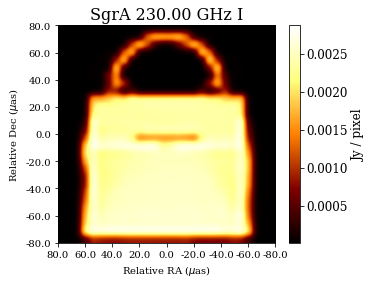

Reconstruction


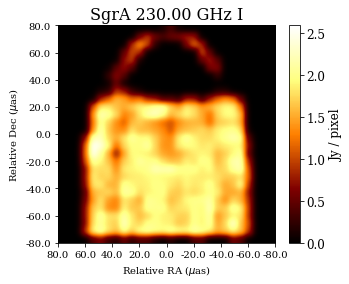

Target


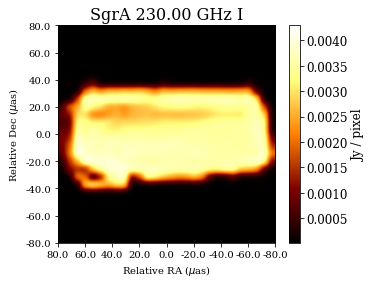

Reconstruction


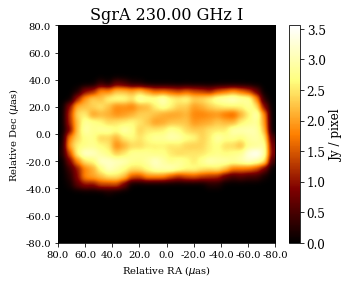

Target


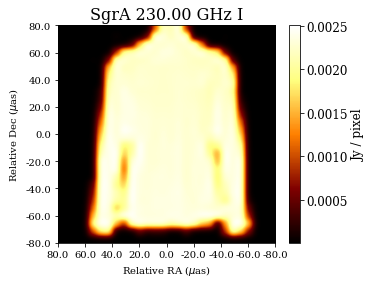

Reconstruction


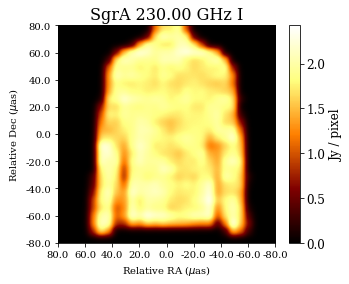

Target


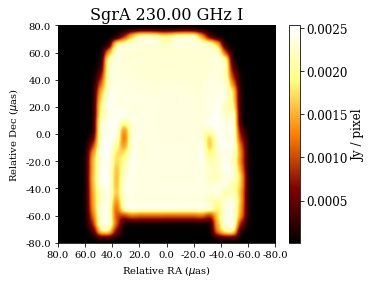

Reconstruction


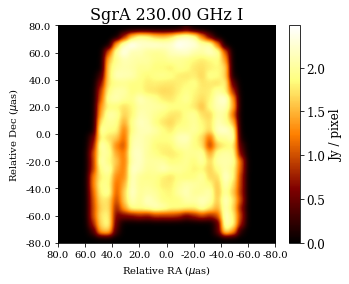

Target


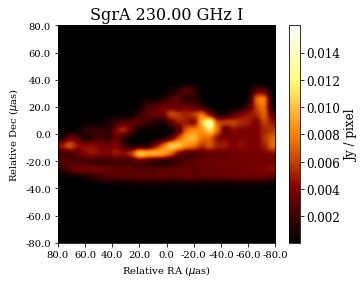

Reconstruction


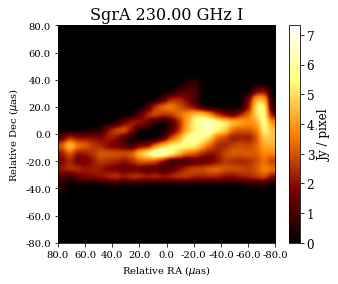

Target


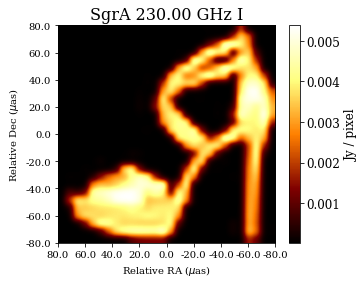

Reconstruction


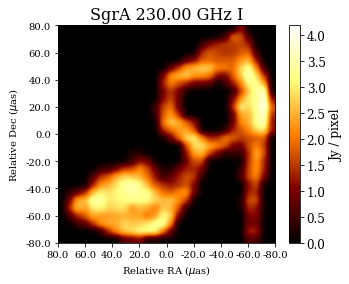

Target


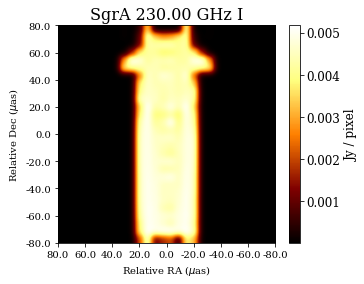

Reconstruction


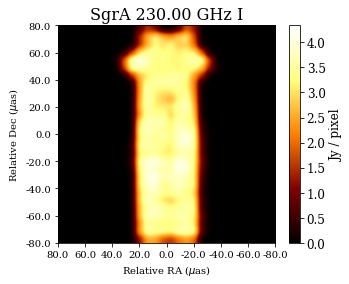

Target


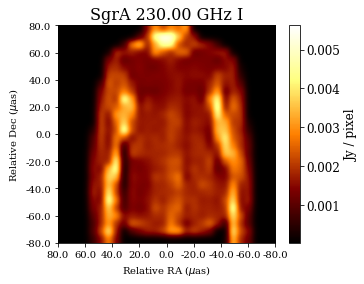

Reconstruction


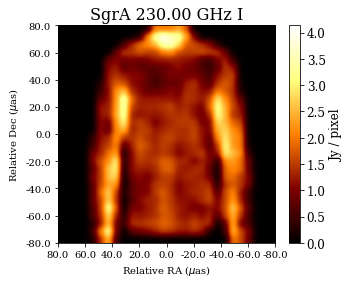

Target


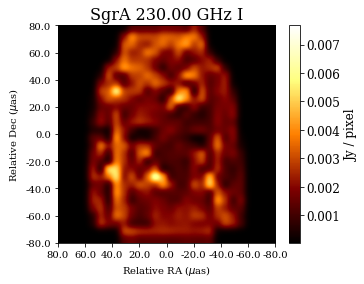

Reconstruction


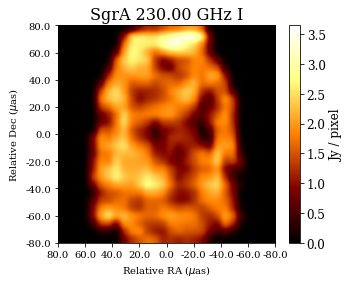

Target


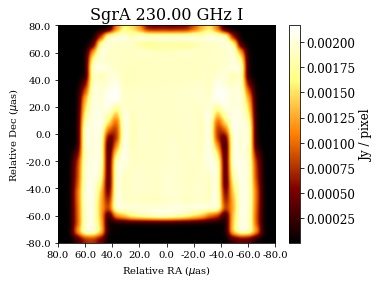

Reconstruction


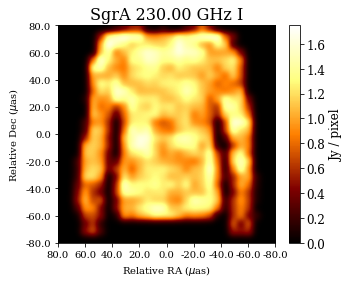

Target


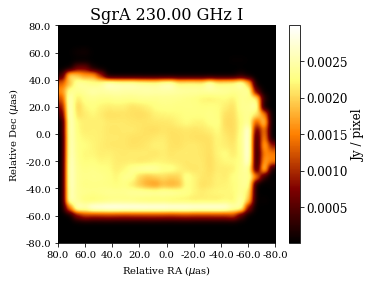

Reconstruction


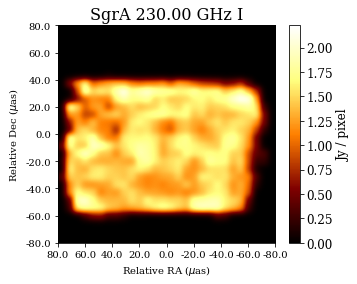

Target


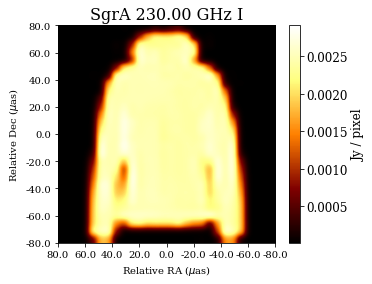

Reconstruction


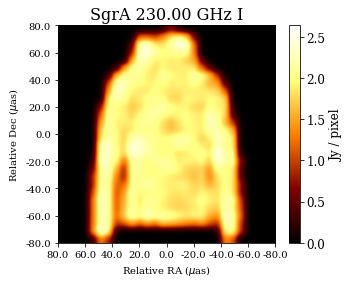

Target


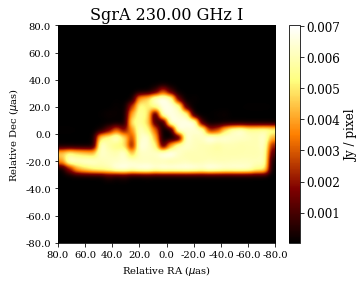

Reconstruction


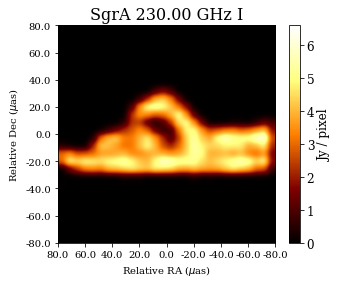

Target


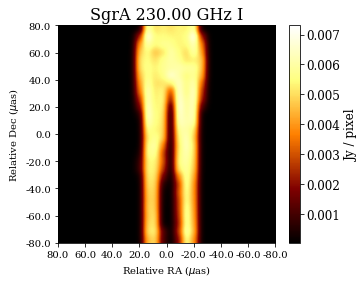

Reconstruction


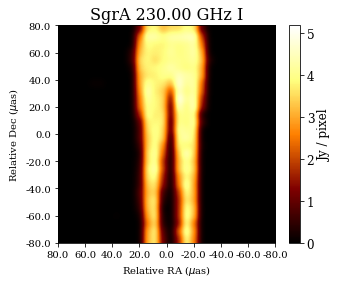

Target


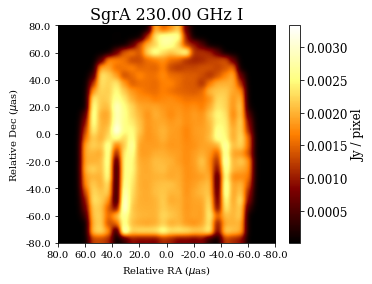

Reconstruction


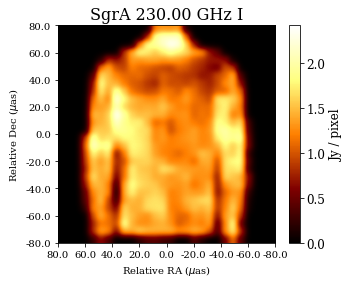

Target


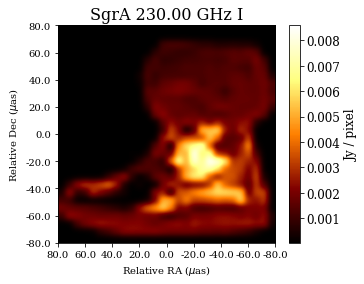

Reconstruction


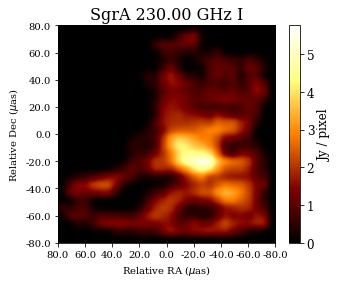

Target


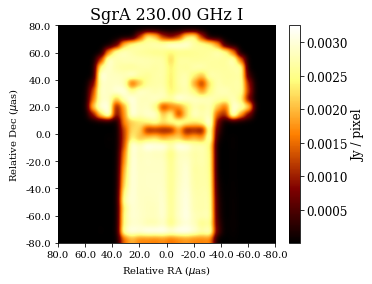

Reconstruction


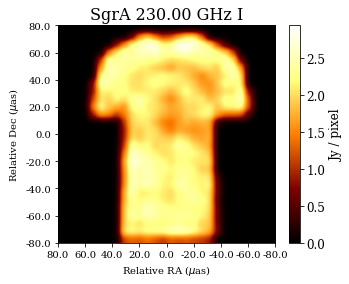

Target


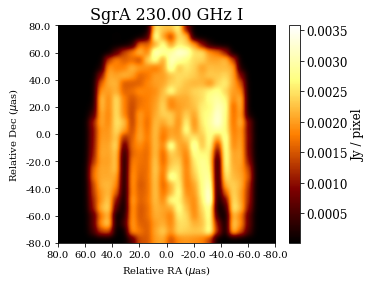

Reconstruction


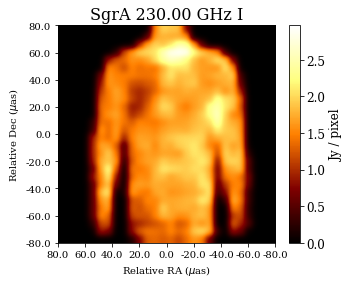

Target


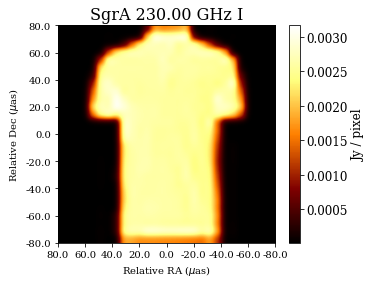

Reconstruction


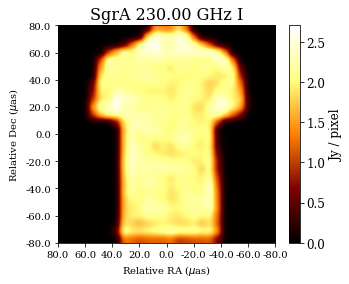

Target


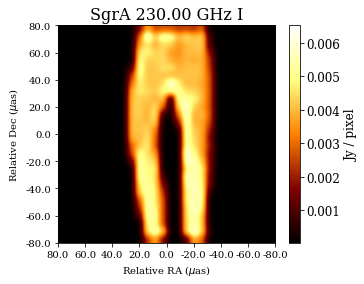

Reconstruction


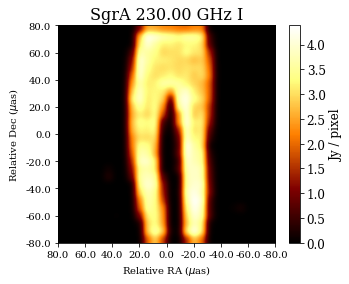

Target


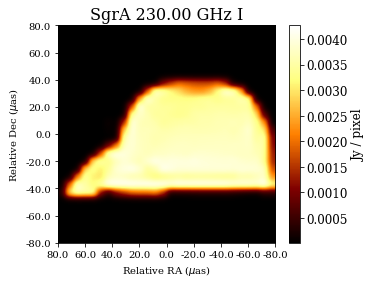

Reconstruction


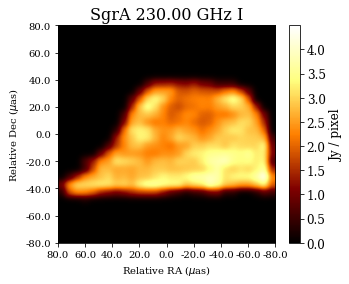

Target


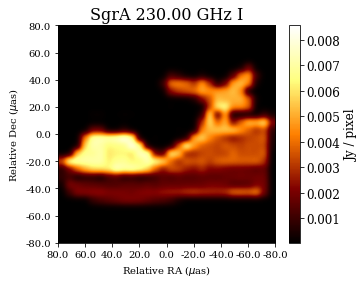

Reconstruction


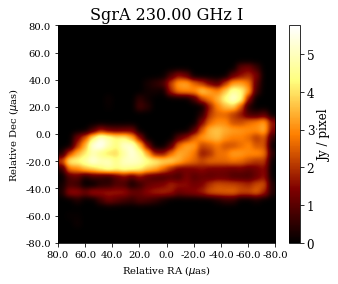

Target


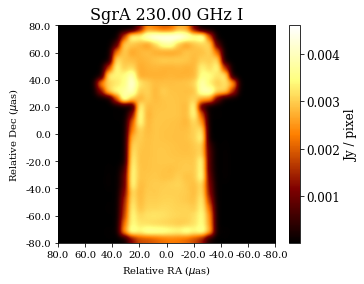

Reconstruction


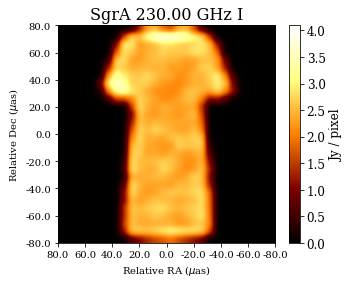

Target


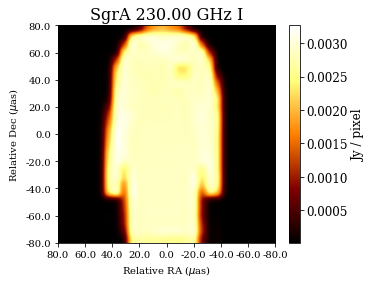

Reconstruction


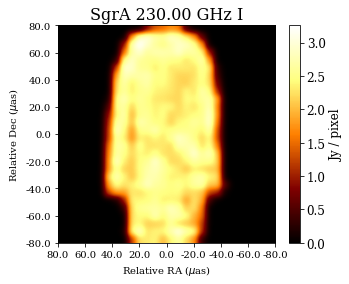

Target


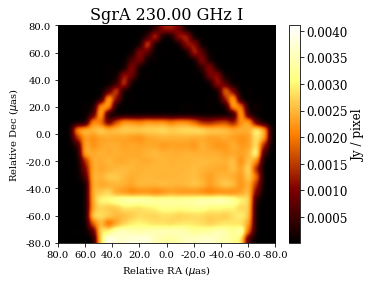

Reconstruction


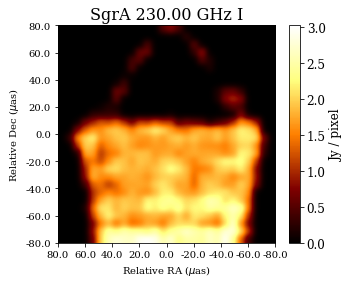

Target


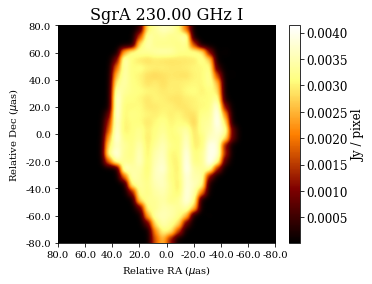

Reconstruction


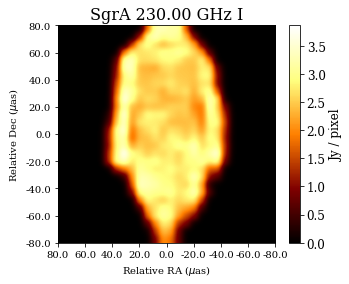

Target


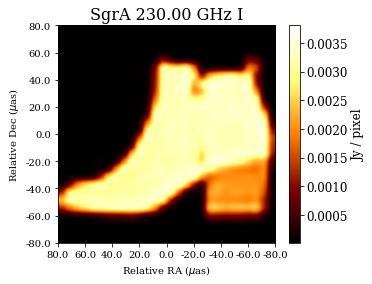

Reconstruction


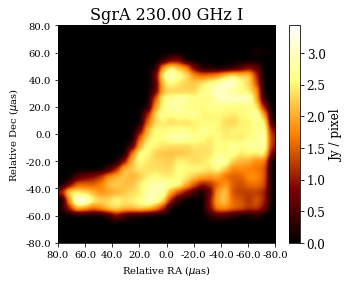

Target


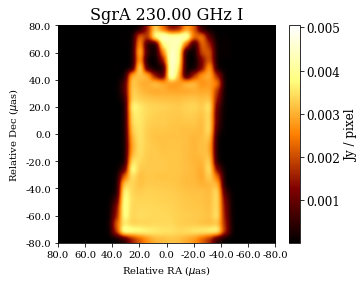

Reconstruction


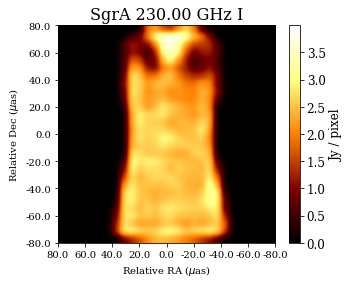

Target


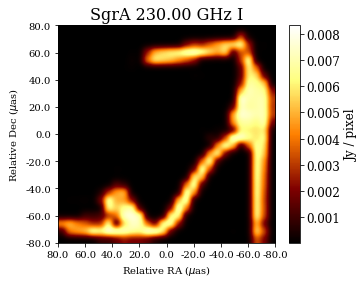

Reconstruction


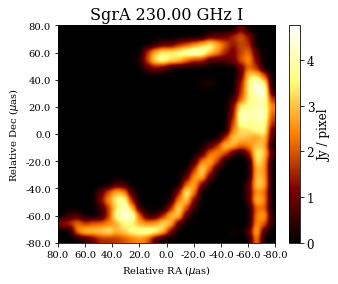

Target


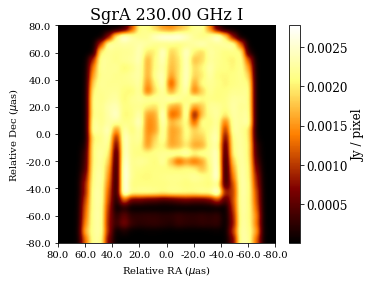

Reconstruction


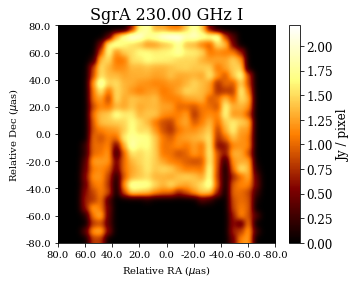

Target


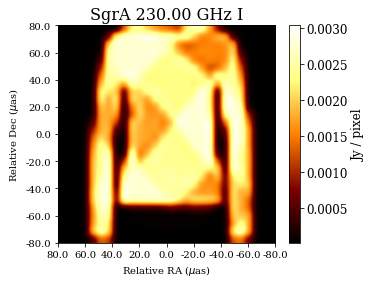

Reconstruction


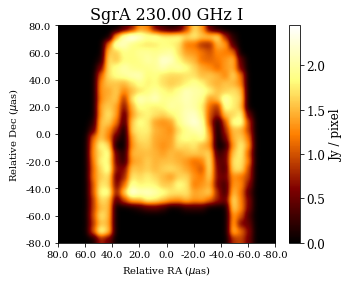

Target


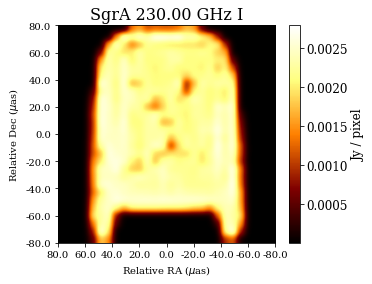

Reconstruction


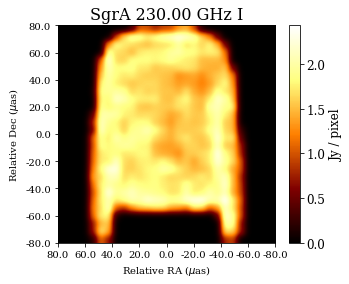

Target


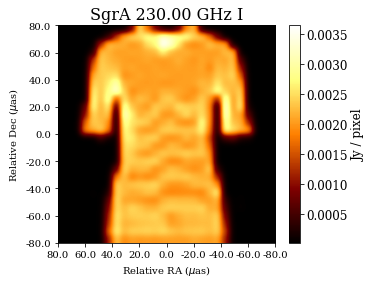

Reconstruction


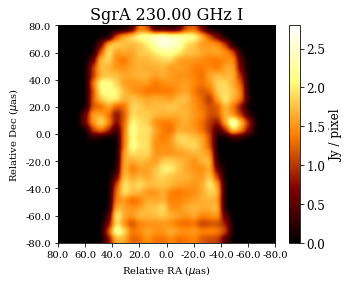

Target


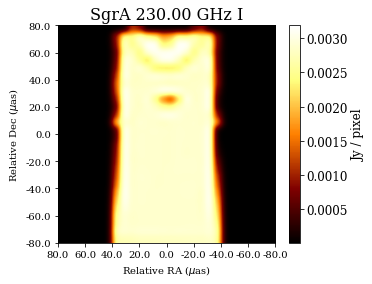

Reconstruction


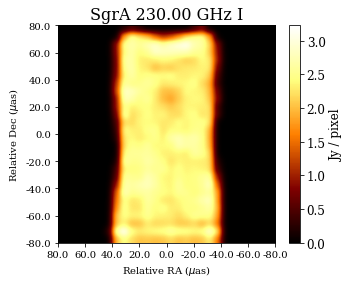

Target


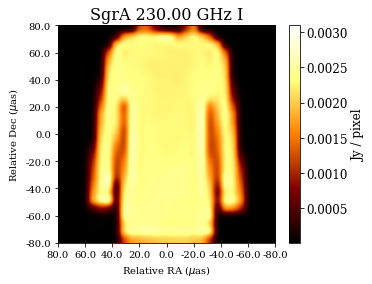

Reconstruction


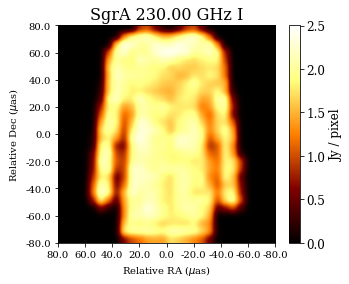

Target


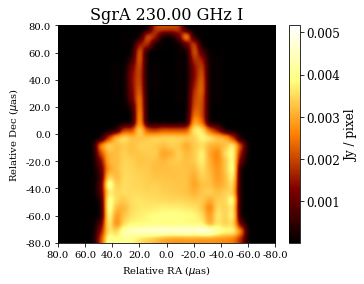

Reconstruction


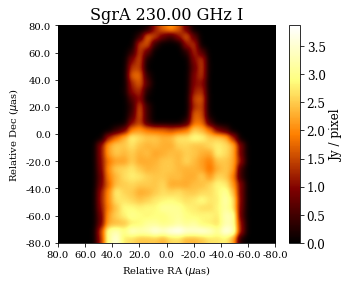

Target


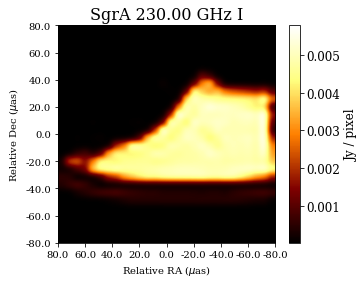

Reconstruction


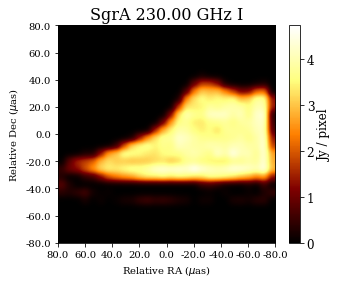

Target


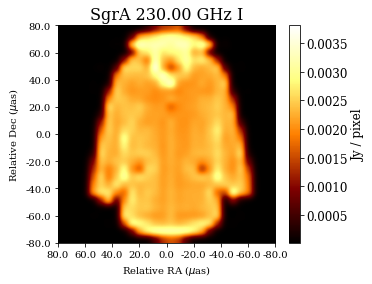

Reconstruction


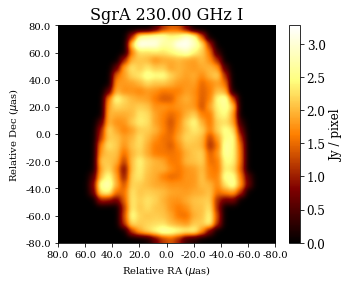

Target


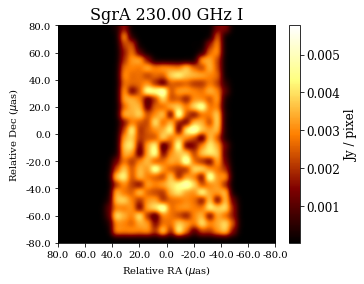

Reconstruction


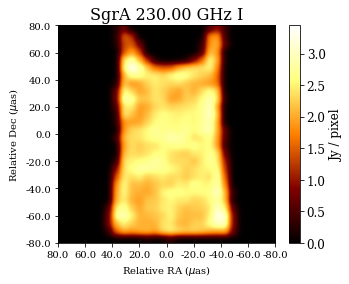

Target


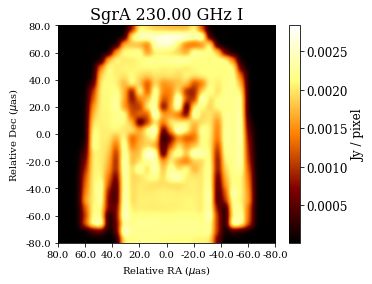

Reconstruction


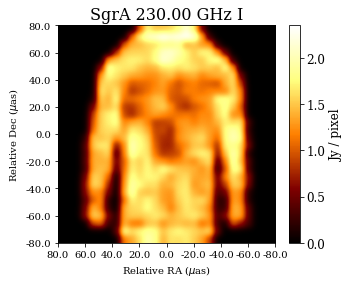

Target


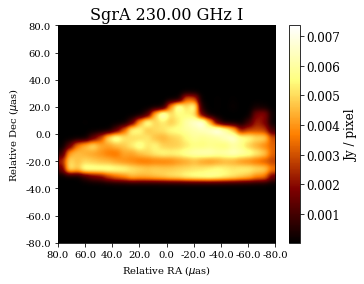

Reconstruction


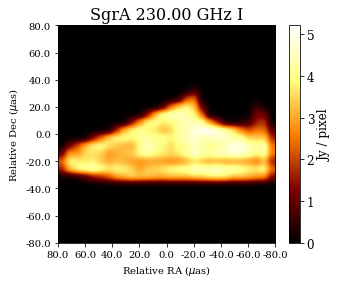

Target


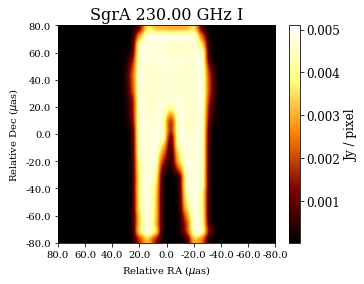

Reconstruction


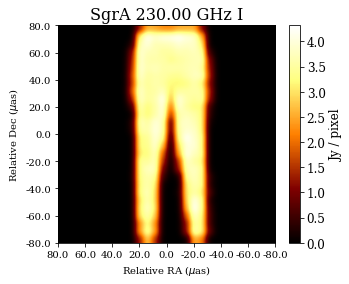

Target


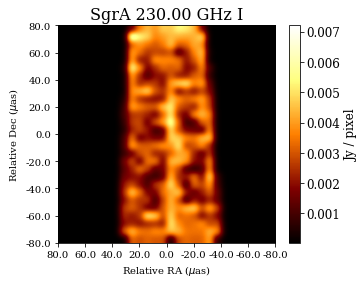

Reconstruction


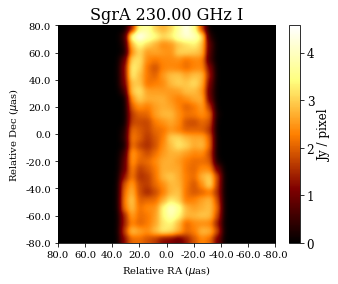

Target


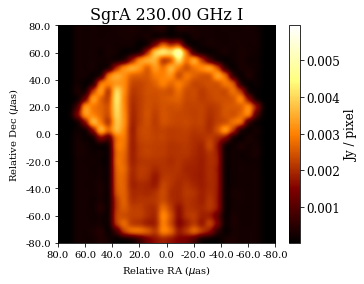

Reconstruction


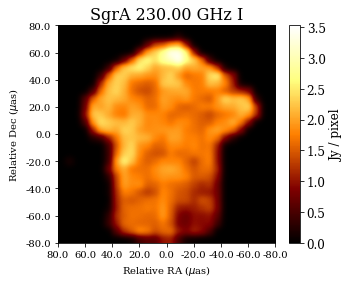

Target


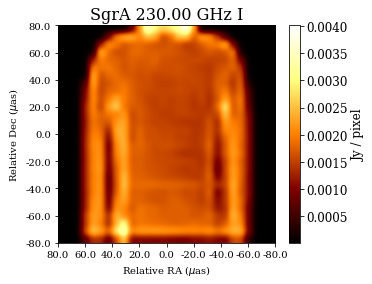

Reconstruction


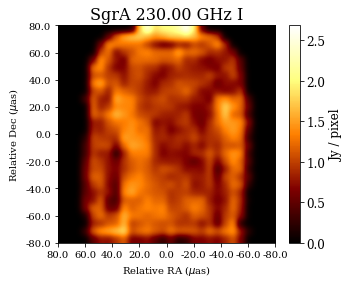

Target


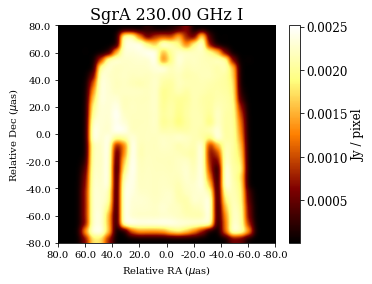

Reconstruction


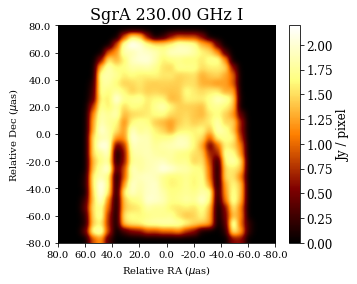

Target


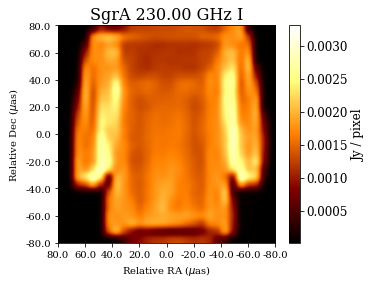

Reconstruction


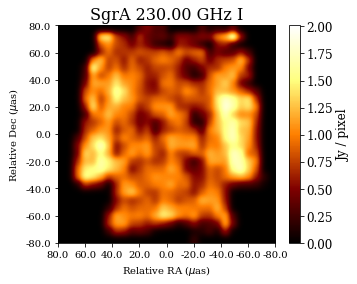

Target


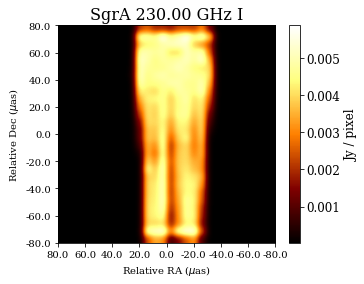

Reconstruction


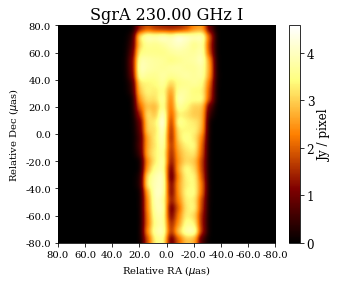

Target


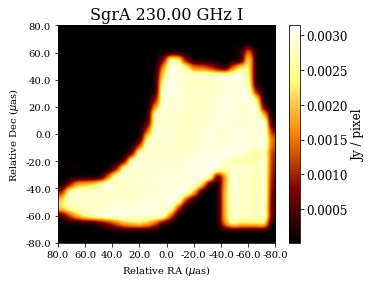

Reconstruction


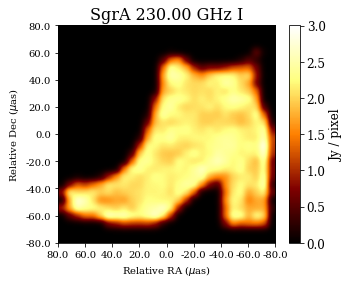

Target


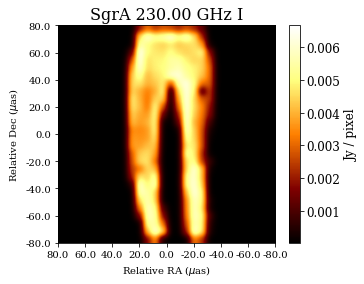

Reconstruction


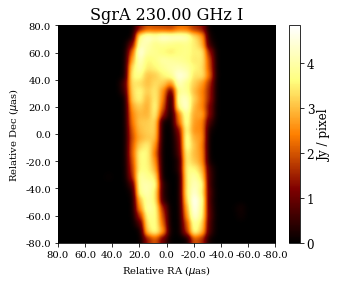

Target


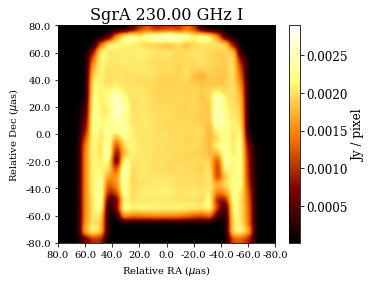

Reconstruction


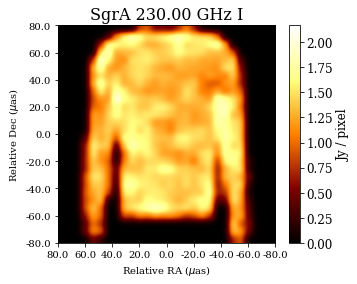

Target


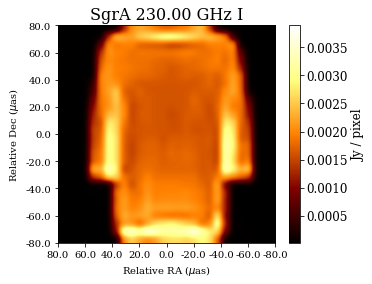

Reconstruction


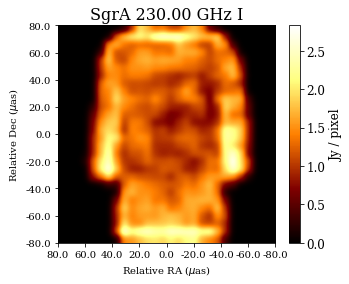

Target


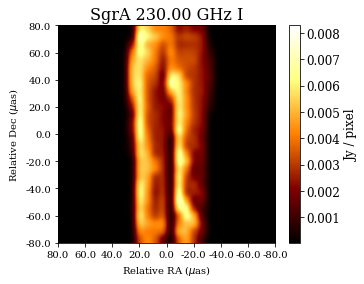

Reconstruction


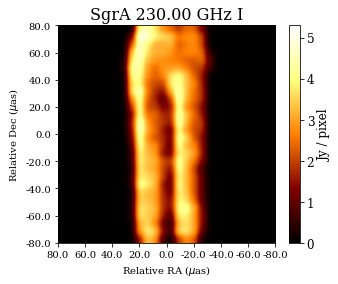

Target


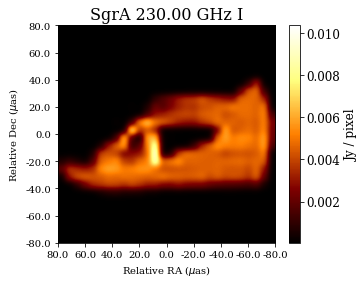

Reconstruction


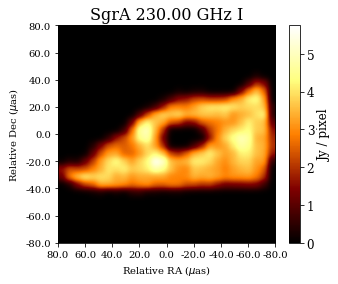

Target


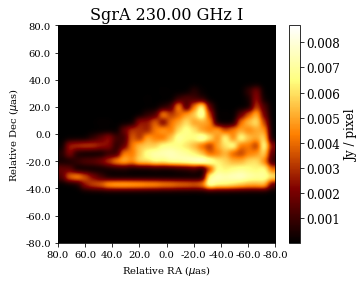

Reconstruction


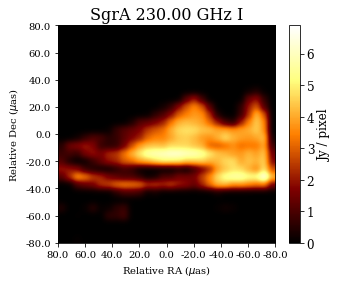

Target


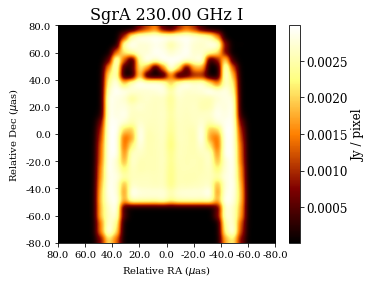

Reconstruction


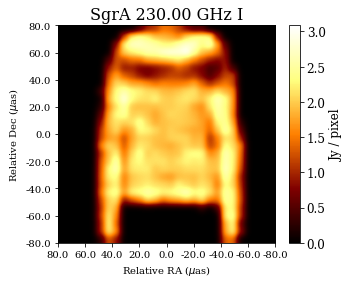

Target


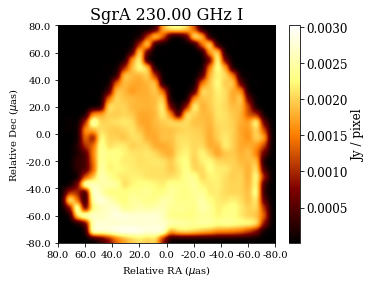

Reconstruction


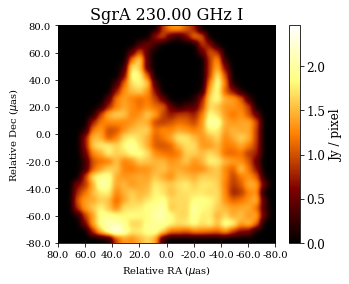

Target


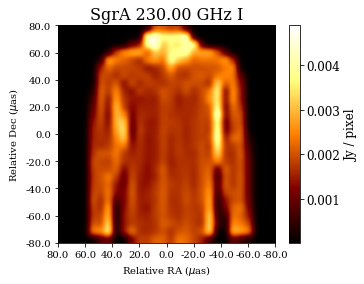

Reconstruction


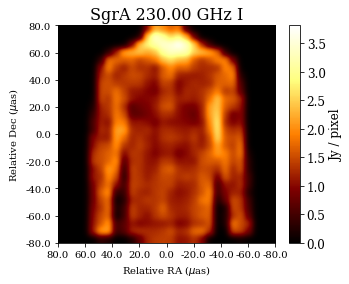

Target


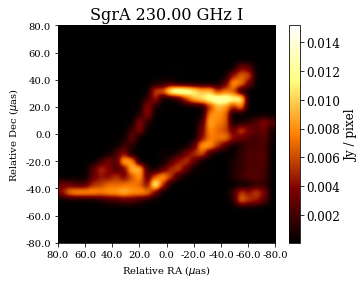

Reconstruction


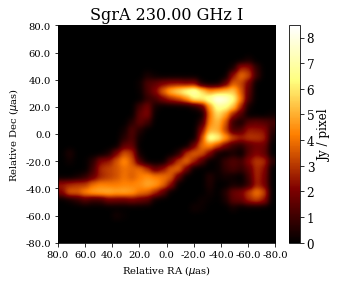

Target


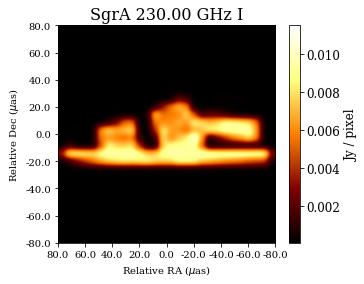

Reconstruction


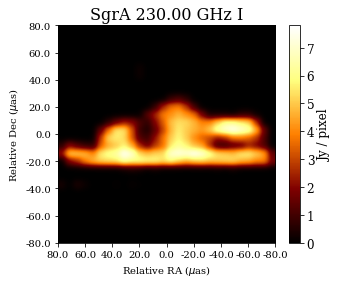

Target


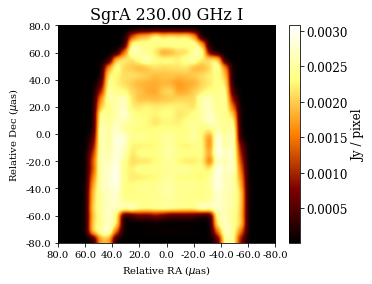

Reconstruction


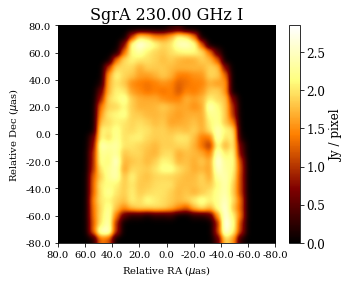

Target


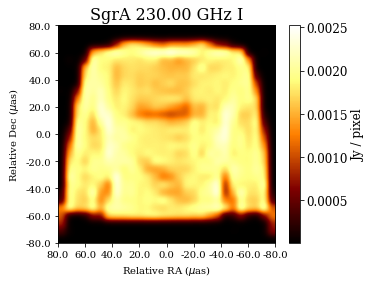

Reconstruction


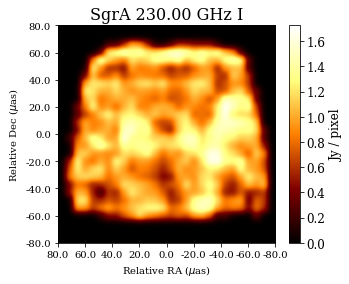

Target


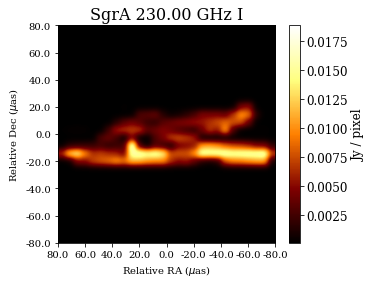

Reconstruction


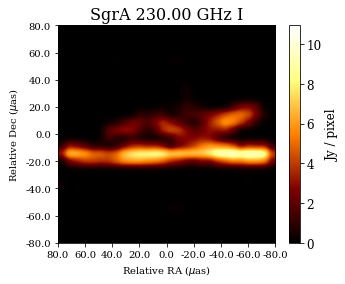

Target


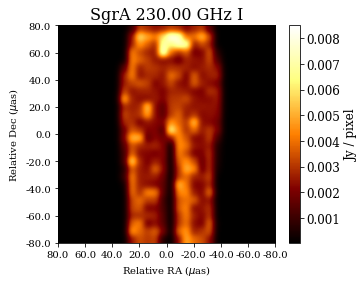

Reconstruction


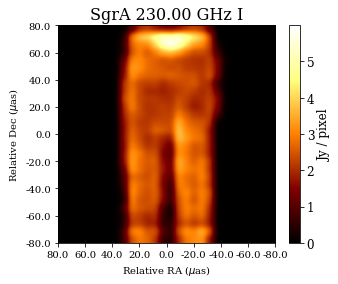

Target


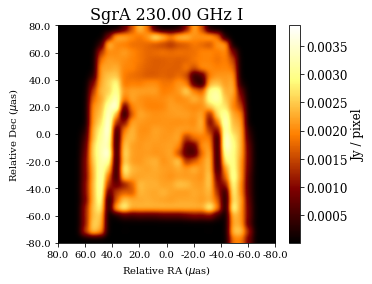

Reconstruction


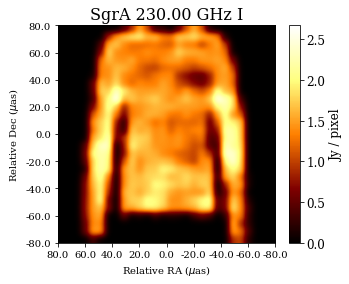

Target


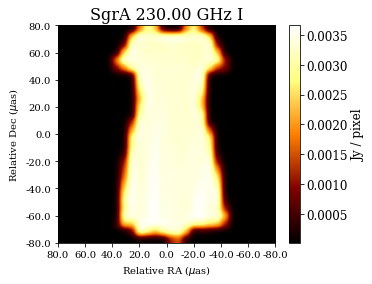

Reconstruction


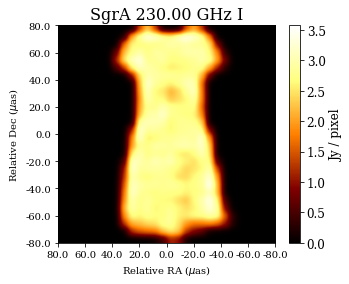

Target


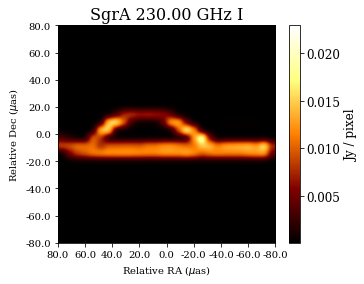

Reconstruction


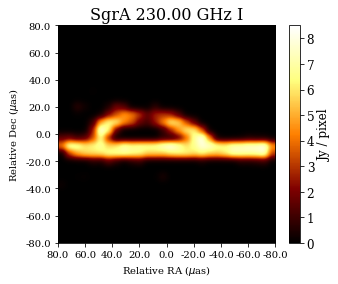

Target


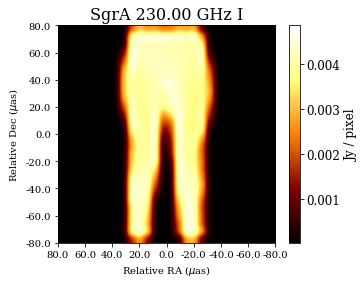

Reconstruction


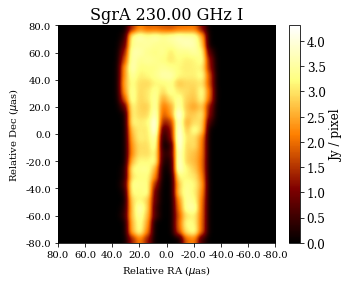

Target


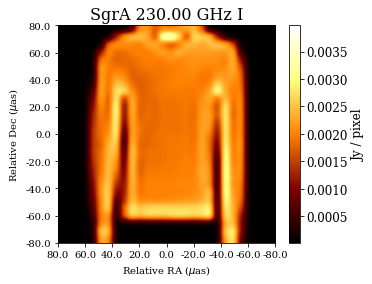

Reconstruction


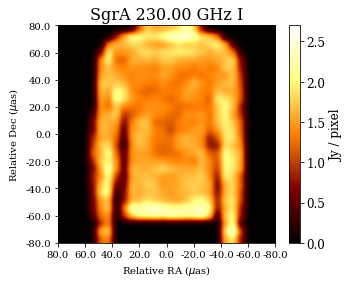

Target


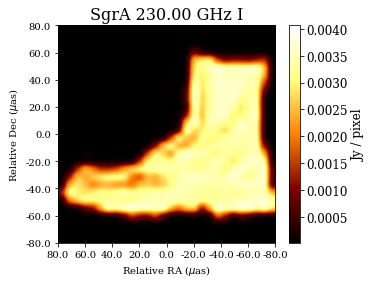

Reconstruction


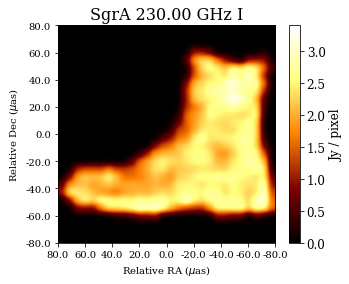

Target


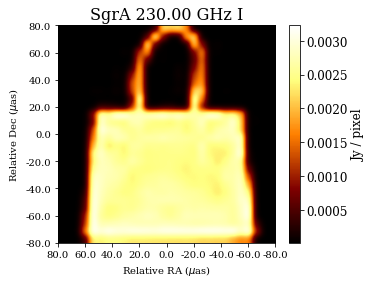

Reconstruction


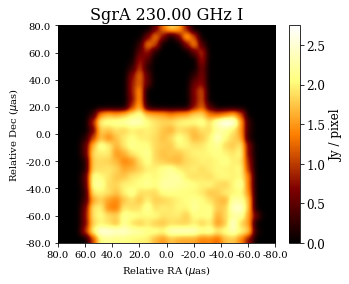

Target


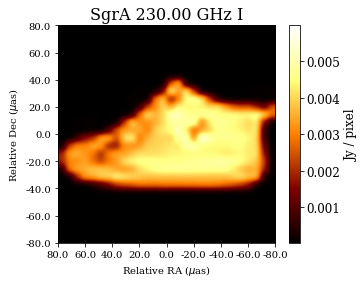

Reconstruction


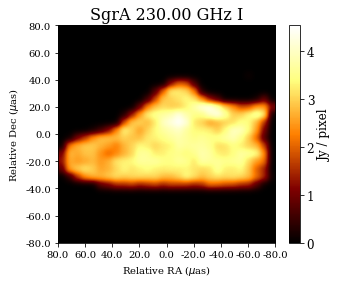

Target


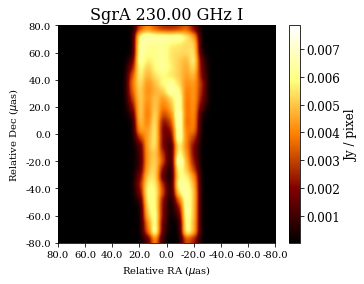

Reconstruction


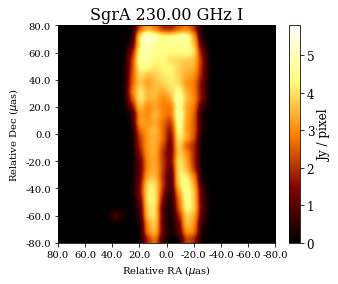

Target


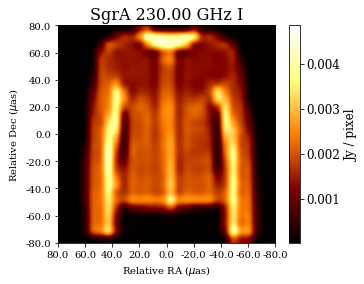

Reconstruction


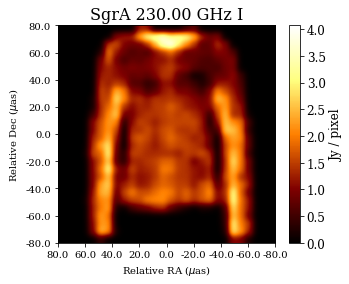

Target


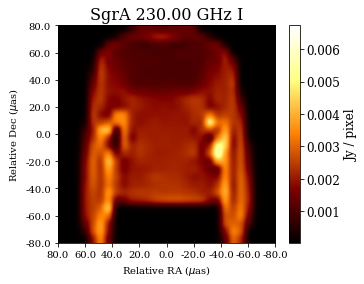

Reconstruction


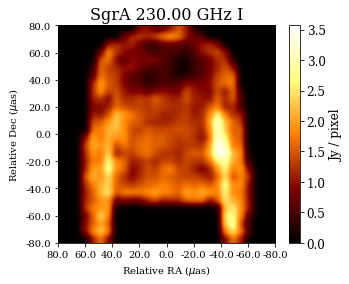

Target


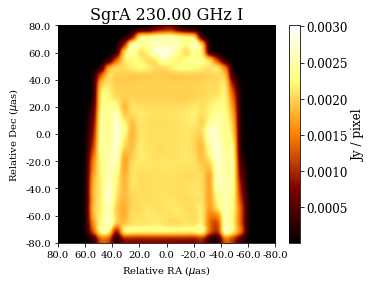

Reconstruction


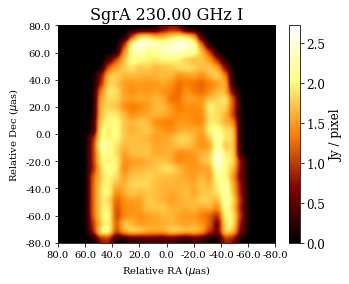

Target


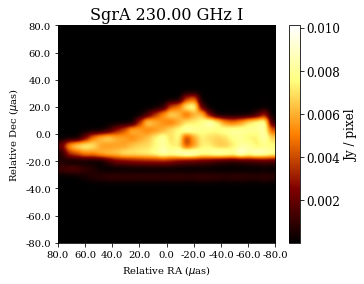

Reconstruction


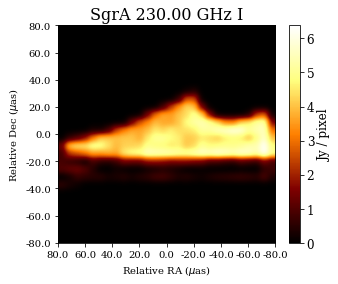

Target


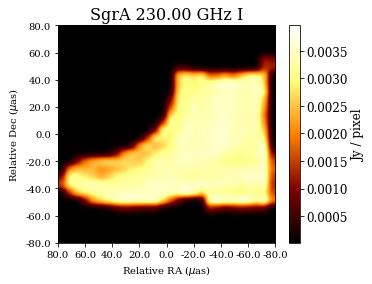

Reconstruction


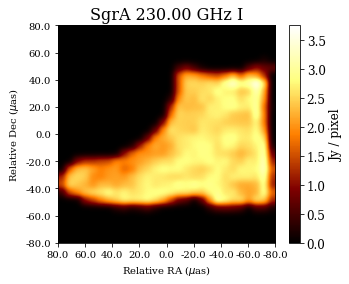

Target


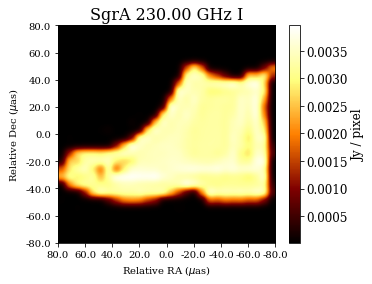

Reconstruction


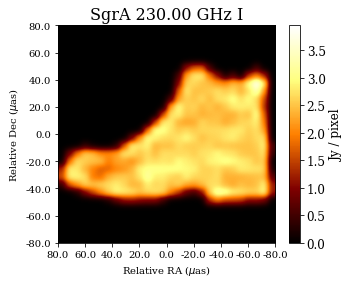

Target


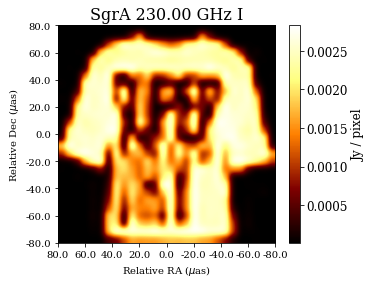

Reconstruction


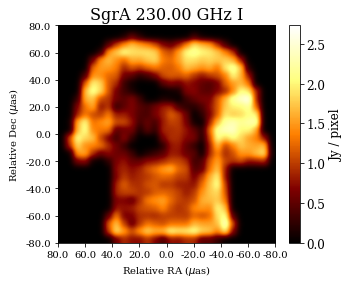

Target


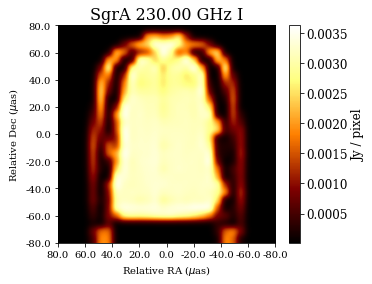

Reconstruction


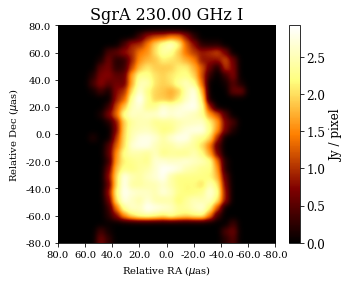

Target


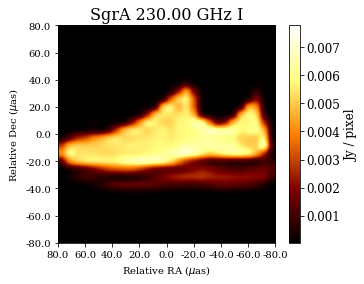

Reconstruction


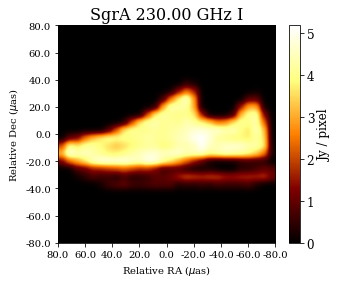

Target


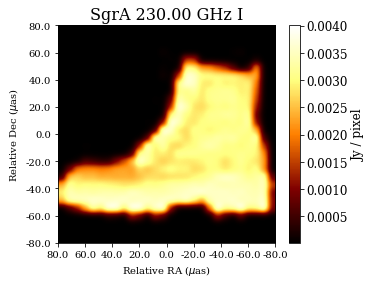

Reconstruction


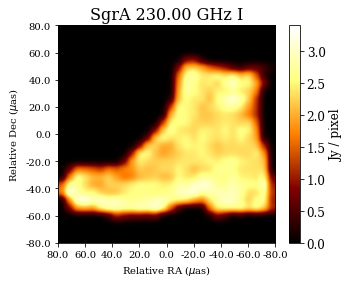

Target


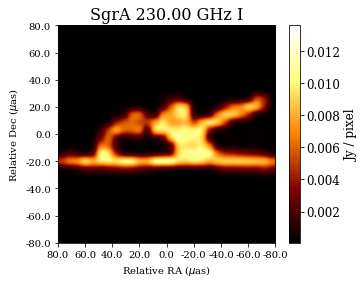

Reconstruction


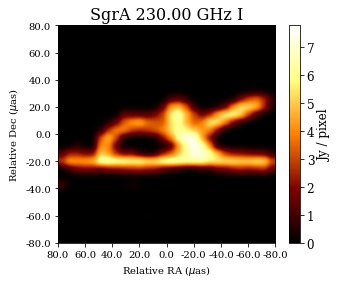

Target


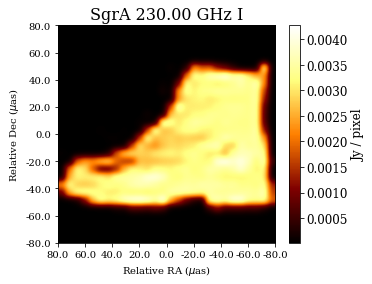

Reconstruction


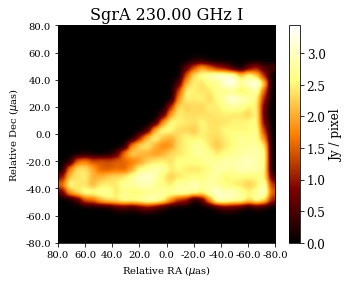

Target


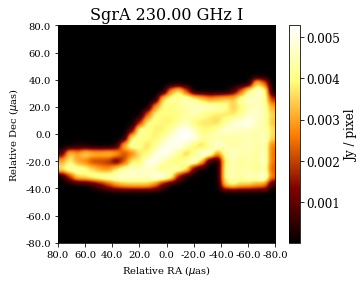

Reconstruction


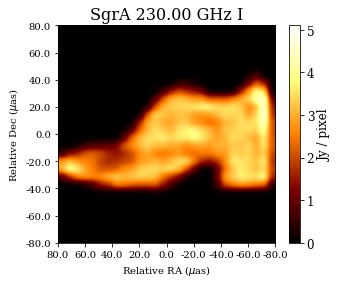

Target


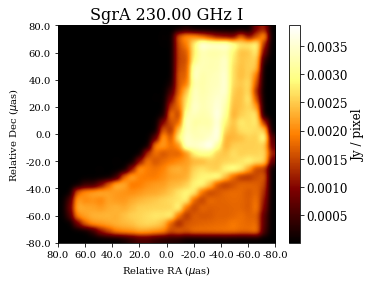

Reconstruction


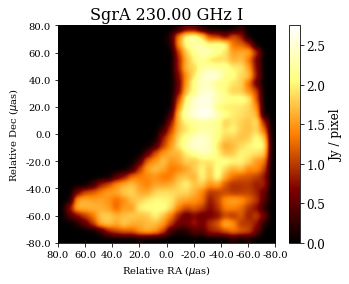

Target


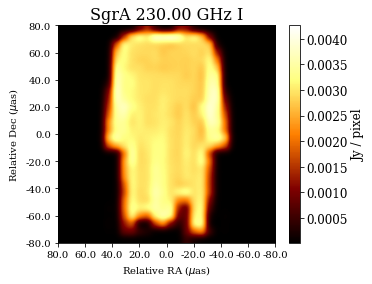

Reconstruction


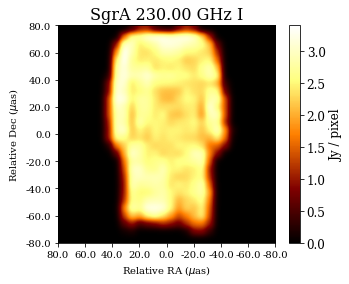

Target


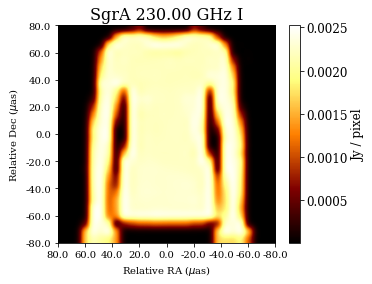

Reconstruction


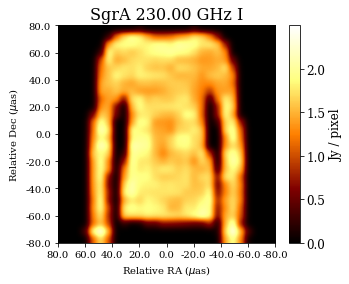

Target


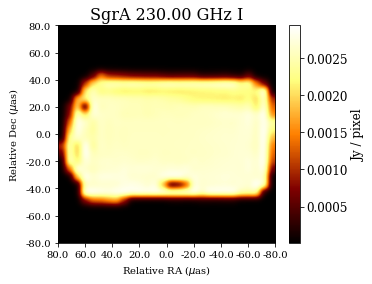

Reconstruction


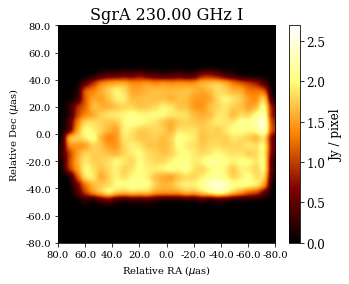

Target


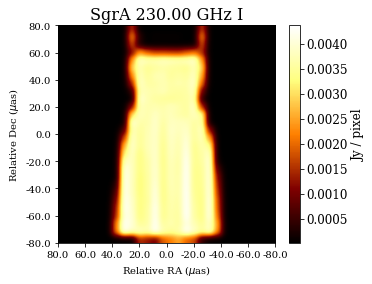

Reconstruction


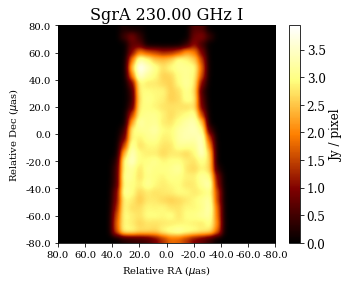

Target


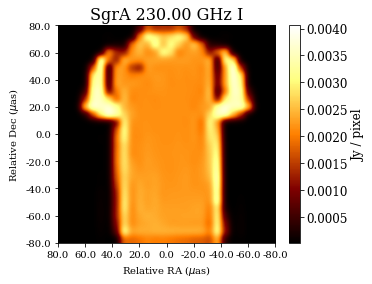

Reconstruction


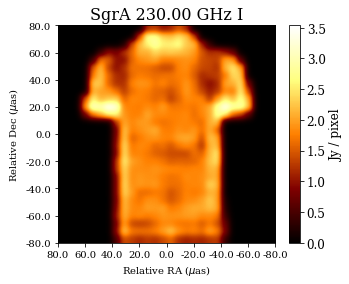

Target


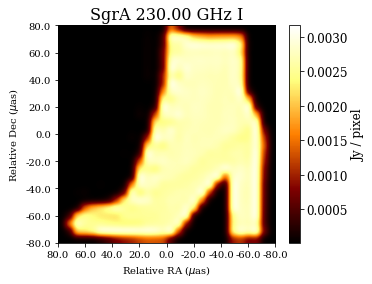

Reconstruction


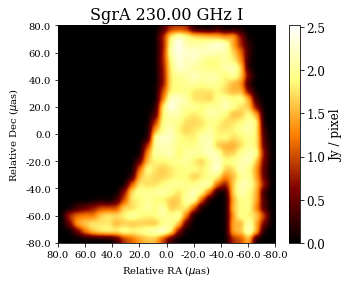

Target


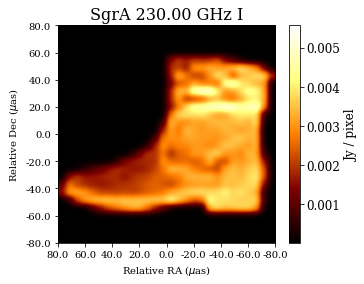

Reconstruction


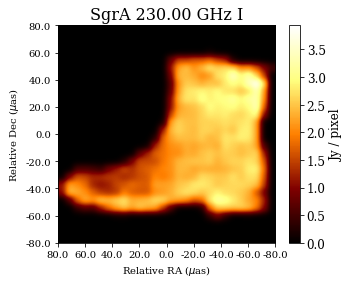

Target


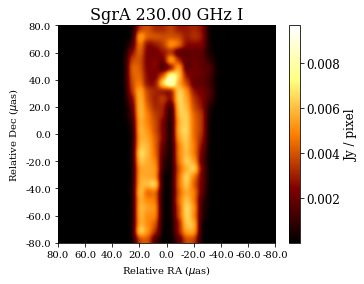

Reconstruction


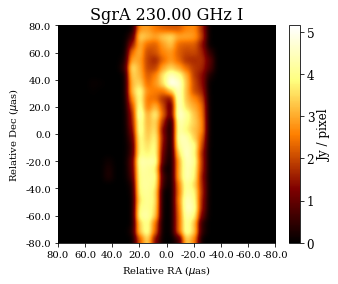

Target


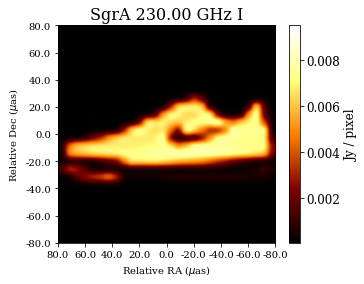

Reconstruction


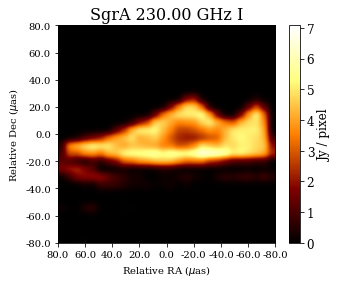

Target


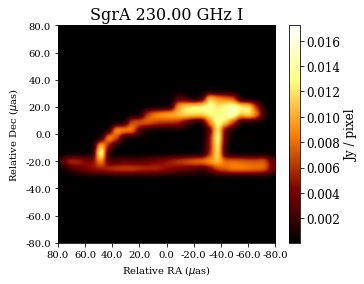

Reconstruction


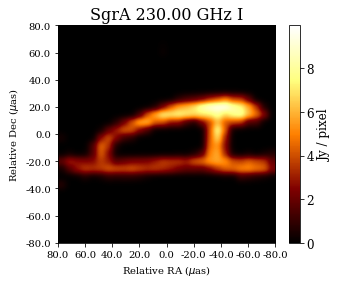

Target


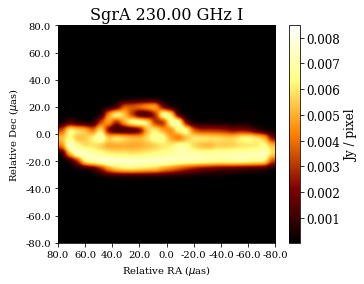

Reconstruction


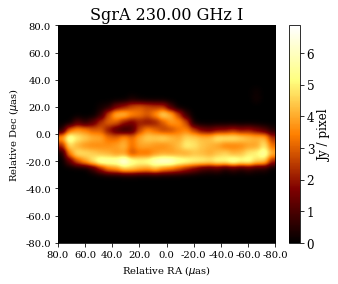

Target


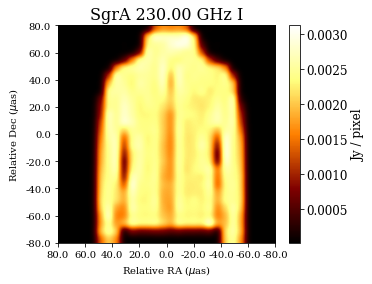

Reconstruction


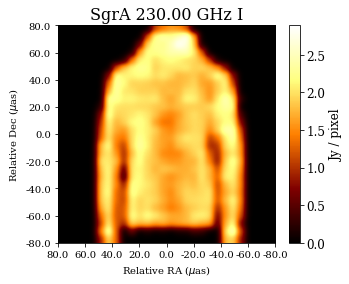

Target


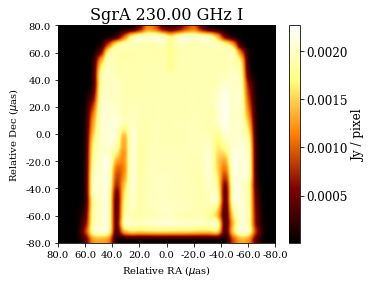

Reconstruction


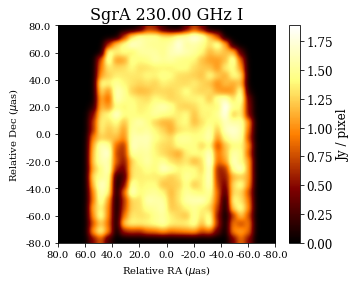


average loss:  0.21607048943876983


In [108]:
# Prevent torch from saving gradients so it evaluates faster
with torch.no_grad():
    tot_loss = 0
    cnt = 1
    for data in tqdm(testloader):
        # get the inputs, outputs
        # see training block for shape desc.
        vis, imgs = data

        # scale vis up so avg pixel is 1
        vis = INPUT_SIZE * vis
        
        # Generate image and sum up loss
        outs = model(vis)
        tot_loss += model.loss(outs, OUTPUT_SIZE * imgs).item()

        # Preview every 10th image
        if cnt % 10 == 0:
            print('Target')
            show_image(imgs[0].numpy())
            print('Reconstruction')
            show_image(outs[0].numpy())
        
        cnt += 1
    
print("average loss: ", tot_loss/cnt)

## Visualize Model

In [137]:
# load trained model
model = ConvNet()
model.load_state_dict(torch.load("models/1dense1convpool/1dense1convpool_44kimg_10ep.pickle"))

<All keys matched successfully>

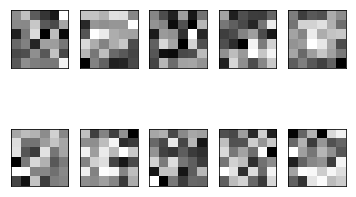

In [123]:
# Visualize convolutional filters
plt.figure()
for i in range(10):
    filt = model.conv[0].weight.data.squeeze()[i]
    
    plt.subplot(2,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(filt.numpy(), cmap=plt.cm.binary)
plt.show()

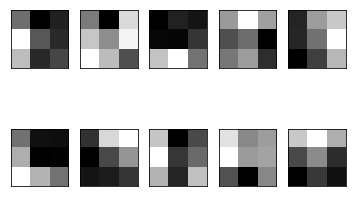

In [117]:
# Visualize convolutional filters
plt.figure()
for i in range(10):
    filt = model.conv[4].weight.data.squeeze()[i]
    
    plt.subplot(2,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(filt.numpy(), cmap=plt.cm.binary)
plt.show()

In [130]:
model.dense[0].weight.data.shape

torch.Size([3136, 2060])

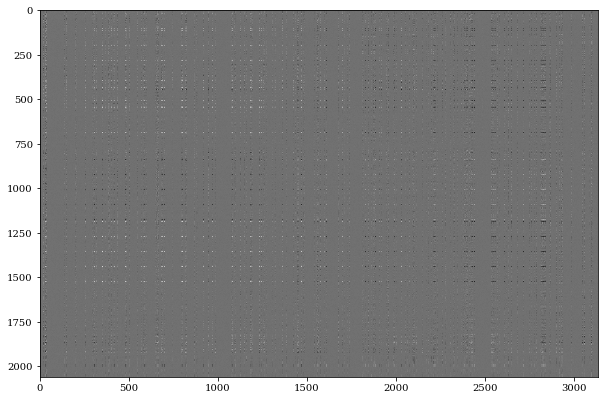

In [152]:
# Visualize dense layer
plt.figure(figsize=(10,10))
filt = model.dense[0].weight.data
plt.imshow(filt.numpy().T, cmap='binary')
plt.show()